# Tugas Hands-on Pemrosesan Audio

**Mata Kuliah:** Sistem & Teknologi Multimedia  
**Nama:** Naufal Haris Nurkhoirulloh
**NIM:** 122140040

Referensi Chat dengan AI : Link Github : https://github.com/Harisskh/multimedia.git 

Referensi Chat dengan AI : 

soal 1 & 2 : https://gemini.google.com/share/effe4b89ce27

soal 2 & 3 : https://gemini.google.com/share/cfaa555866cc

soal 5     : https://gemini.google.com/share/894e3b836d98


---

## Deskripsi Tugas

 Tugas ini dirancang untuk menguji pemahaman mahasiswa terhadap konsep-konsep fun
damental dalam pemrosesan audio digital, termasuk manipulasi sinyal audio, filtering,
 pitch shifting, normalisasi, dan teknik remix audio. Mahasiswa diharapkan dapat men
erapkan teori yang telah dipelajari dalam praktik langsung menggunakan Python dan
 pustaka pemrosesan audio.

---

### Soal 1: Rekaman dan Analisis Suara Multi-Level

#### Import Library

In [1]:
# Import Library (Satu-satunya sel kode dalam template ini)
import numpy as np
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
from PIL import Image
import cv2
from IPython.display import Audio, HTML, display
import os

# Set matplotlib untuk menampilkan plot inline
%matplotlib inline

# Tampilkan versi library untuk dokumentasi
print("Library versions:")
print(f"NumPy: {np.__version__}")
print(f"Matplotlib: {plt.matplotlib.__version__}")
print(f"Librosa: {librosa.__version__}")
print(f"OpenCV: {cv2.__version__}")

# Tambahkan import lain jika diperlukan saat mengerjakan tugas

Library versions:
NumPy: 2.2.5
Matplotlib: 3.10.6
Librosa: 0.11.0
OpenCV: 4.10.0


#### Load data audio1 dan exploration
untuk lihat audio saya dan informasi apa aja yang terdapat pada audio saya

In [2]:
# Muat file audio dan tampilkan metadata dasar
audio_path = os.path.join('audio', 'audio1.wav')

# Membaca audio (y: array amplitudo, sr: sample rate)
y, sr = librosa.load(audio_path, sr=None, mono=False)  # mono=False agar bisa deteksi jumlah kanal

# Jika y 1D: mono, jika 2D: stereo/multi-channel
if y.ndim == 1:
  num_channels = 1
  channel_info = 'Mono'
  total_samples = y.shape[0]
else:
  num_channels = y.shape[0]
  channel_info = f'Stereo ({num_channels} channels)' if num_channels == 2 else f'{num_channels} channels'
  total_samples = y.shape[1]

duration_sec = total_samples / sr

print(f"Path file      : {audio_path}")
print(f"Sample rate    : {sr} Hz")
print(f"Durasi         : {duration_sec:.2f} detik")
print(f"Jumlah kanal   : {channel_info}")
print(f"Total sampel   : {total_samples}")

Path file      : audio\audio1.wav
Sample rate    : 44100 Hz
Durasi         : 25.07 detik
Jumlah kanal   : Mono
Total sampel   : 1105448


#### Visualisasi dengan Waveform dan Spectogram
Disini saya mau melihat dan menganalisis hasil dari visualisasi audio suara saya itu

C:\Users\Naufal Haris\AppData\Local\Temp\ipykernel_7924\3691184900.py:2: FutureWarning: waveshow() keyword argument 'x_axis' has been renamed to 'axis' in version 0.10.0.
	This alias will be removed in version 1.0.
  librosa.display.waveshow(y, sr=sr, color='blue', x_axis='time')


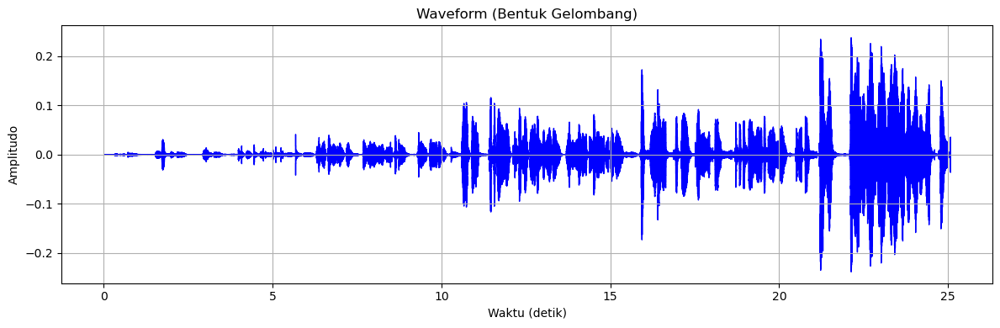

In [3]:
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y, sr=sr, color='blue', x_axis='time')
plt.title('Waveform (Bentuk Gelombang)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.grid(True)
plt.tight_layout()
plt.show()


##### Analisis Waveform
Berdasarkan hasil visualisasi diatas kita bisa lihat gelombangnya semakin naik per 5 detik ya

- Mulai dari detik 0-5 gelombangnya terlihat sangat kecil yang berarti amplitudonya tidak keras/kecil sesuai intruksi saya record dengan suara berbisik atau rendah
- lalu detik 5-10 gelombang suaranya terlihat seperti suara orang berbicara normal, disitu amplitudonya terlihat stabil dan normal 
- selanjutnya detik 10-15 gelombangnya mulai naik yang menandakan suara dari audionya keras
- di detik 15-20 terlihat gelombangnya melenting tinggi yang menandakan mungkin sumber suaranya tinggi atau nyaring seperti instruksi suara cempreng yang dibuat
- terakhir detik 20-25 gelombangnya terlihat ramai dan menjulang tinggi yang berarti amplitudonya sangat keras sesuai dengan instruksi soal dimana suara saya disitu sedang teriak 

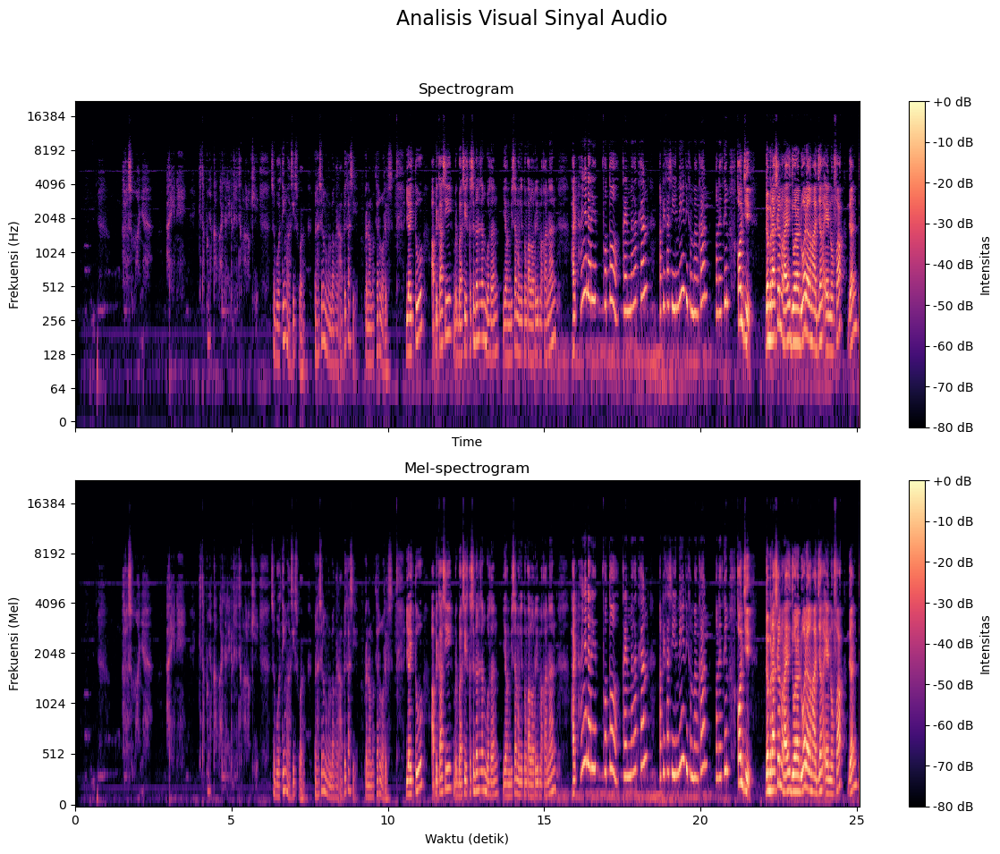

In [4]:
# 3. Membuat Visualisasi
fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(12, 10))
fig.suptitle('Analisis Visual Sinyal Audio', fontsize=16)

# b. Menampilkan Spectrogram
# Lakukan Short-Time Fourier Transform (STFT)
D = librosa.stft(y)
# Konversi amplitudo ke desibel (dB)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
img_spec = librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log', ax=ax[0])
ax[0].set_title('Spectrogram')
ax[0].set_ylabel('Frekuensi (Hz)')
fig.colorbar(img_spec, ax=ax[0], format='%+2.0f dB', label='Intensitas')


# c. Menampilkan Mel-spectrogram
# Hitung Mel-spectrogram
M = librosa.feature.melspectrogram(y=y, sr=sr)
# Konversi ke desibel (dB)
M_db = librosa.power_to_db(M, ref=np.max)
img_mel = librosa.display.specshow(M_db, sr=sr, x_axis='time', y_axis='mel', ax=ax[1])
ax[1].set_title('Mel-spectrogram')
ax[1].set_xlabel('Waktu (detik)')
ax[1].set_ylabel('Frekuensi (Mel)')
fig.colorbar(img_mel, ax=ax[1], format='%+2.0f dB', label='Intensitas')


# Merapikan layout dan menampilkan plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

##### Analisis spectogram 

pada spectogram ada domain waktu, frekuensi, dan amplitudo. waktu ada di axis x, frekuensi di axis y, dan amplitudo itu warna kuning cerah.

- pada detik 0-5 terlihat warnanya nyaris gelap(hitam) dengan ada sedikit warna ungu artinya energi suaranya sangat rendah atau kecil dan frekuensi suaranya terlihat jarang.
- lanjut detik 5-10 warnanya terlihat mulai rapat dan ada sedikit warna kuning yang tidak begitu terang berarti energi suaranya normal seperti sedang berbicara seperti biasa.
- detik 10-15 warna ungunya terlihat rapat sepertinya frekuensi suaranya stabil dengan banyak variasi warna kuning yang berarti energi dari sumber suaranya lumayan keras.
- di detik 15-20 energi di frekuensi bawah mungkin terlihat sedikit lebih lemah dibanding suara di "detik 10-15" namun pita energi warna kuning itu terlihat sangat terang hingga mencapai 2048 hz. 
- detik 20-25 hampir didominasi oleh pita energi warna kuning yang sangat terang menjulang tinggi hingga mencapai 4096 hz

#### Resampling

In [5]:
import librosa
import soundfile as sf # Pustaka untuk menyimpan file audio
# Muat file audio dan tampilkan metadata dasar
audio_path = os.path.join('audio', 'audio1.wav')

# Membaca audio (y: array amplitudo, sr: sample rate)
y_original, sr_original = librosa.load(audio_path, sr=None, mono=False)  # mono=False agar bisa deteksi jumlah kanal

print(f"Audio Asli sebelum resampling:")
print(f"Laju Sampel Asli: {sr_original} Hz")
print(f"Durasi Asli: {librosa.get_duration(y=y_original, sr=sr_original):.2f} detik")

# melakukan down sampling ke kualitas telepon

# Downsample ke kualitas telepon (8,000 Hz)
y_telepon, sr_telepon = librosa.load(audio_path, sr=8000)

print("\nAudio setelah Resampling:")
print(f"Laju Sampel Telepon: {sr_telepon} Hz")

print(f"\n--- Analisis Durasi ---")
print(f"Durasi Asli (di {sr_original} Hz): {librosa.get_duration(y=y_original, sr=sr_original):.2f} detik")
print(f"Durasi Telepon (di {sr_telepon} Hz): {librosa.get_duration(y=y_telepon, sr=sr_telepon):.2f} detik")



Audio Asli sebelum resampling:
Laju Sampel Asli: 44100 Hz
Durasi Asli: 25.07 detik

Audio setelah Resampling:
Laju Sampel Telepon: 8000 Hz

--- Analisis Durasi ---
Durasi Asli (di 44100 Hz): 25.07 detik
Durasi Telepon (di 8000 Hz): 25.07 detik


#### memvisualisasikan hasil sampling

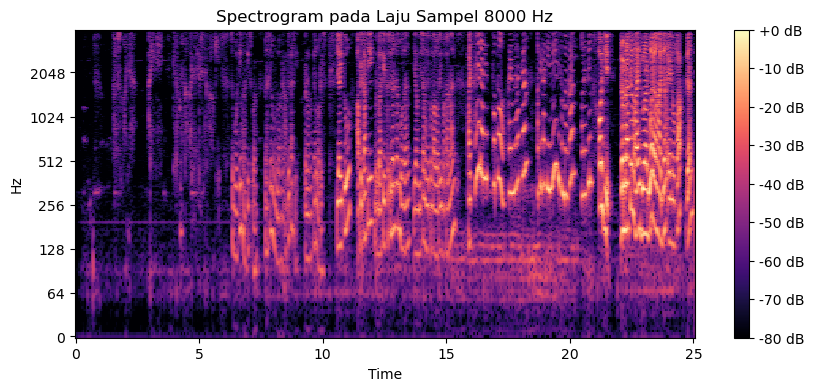

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Buat spectrogram untuk audio kualitas telepon
D_telepon = librosa.stft(y_telepon)
S_db_telepon = librosa.amplitude_to_db(np.abs(D_telepon), ref=np.max)

# Tampilkan
fig, ax = plt.subplots(figsize=(10, 4))
img = librosa.display.specshow(S_db_telepon, sr=sr_telepon, x_axis='time', y_axis='log', ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set_title(f'Spectrogram pada Laju Sampel {sr_telepon} Hz')
plt.show()

##### Analisis perbandingan hasil sampling dengan suara asli

pertama dari segi durasi baik audio asli dengan audio hasil resampling durasinya tetap di 25.07 detik. Berdasarkan percakapan saya dengan gemini hal ini karena librosa secara cerdas melakukan interpolasi data untuk mempertahankan durasi audio yang sama meskipun jumlah sampelnya berubah.

kemudian dari kualitas audio dapat terlihat pada hasil resampling kalau pada suara cempreng dan suara teriak itu seperti dipotong bagian atasny (clipping) yang membuat suaranya menjadi kehilangan ketajaman, dan mungkin kehilangan beberapa informasi suara.

In [7]:
# Simpan file audio yang sudah di-resample
sf.write('audio_telepon_8000Hz.wav', y_telepon, sr_telepon)

print("\nFile audio yang telah di-resample berhasil disimpan!")


File audio yang telah di-resample berhasil disimpan!


### Soal 2: Noise Reduction dengan Filtering

#### Load data dan visualisasi


📊 INFORMASI AUDIO:
   - Sample rate: 44100 Hz
   - Durasi: 8.08 detik
   - Jumlah sample: 356352
   - Channels: Mono


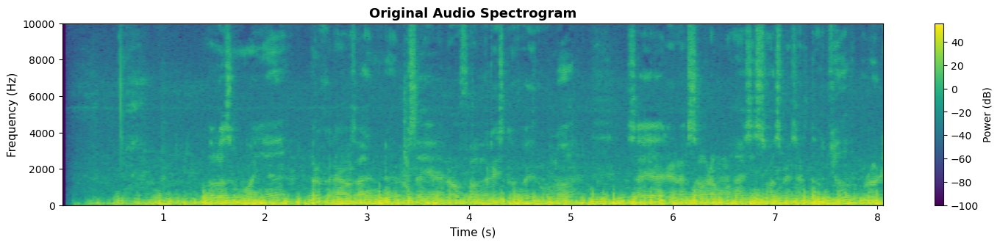

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy import signal

# Baca file audio dari folder audio
fs, audio = wavfile.read('audio/audio2.wav')

# Informasi audio
print(f"\n📊 INFORMASI AUDIO:")
print(f"   - Sample rate: {fs} Hz")
print(f"   - Durasi: {len(audio)/fs:.2f} detik")
print(f"   - Jumlah sample: {len(audio)}")
print(f"   - Channels: Mono")

# Visualisasi
fig = plt.figure(figsize=(15, 12))

# 2. Spektrogram
ax2 = plt.subplot(4, 1, 2)
f, t, Sxx = signal.spectrogram(audio, fs, nperseg=1024)
pcm = ax2.pcolormesh(t, f, 10 * np.log10(Sxx + 1e-10), shading='gouraud', cmap='viridis')
ax2.set_ylabel('Frequency (Hz)', fontsize=11)
ax2.set_xlabel('Time (s)', fontsize=11)
ax2.set_title('Original Audio Spectrogram', fontweight='bold', fontsize=13)
ax2.set_ylim(0, 10000)  # Focus pada 0-10kHz
plt.colorbar(pcm, ax=ax2, label='Power (dB)')

plt.tight_layout()
plt.savefig('01_original_audio_analysis.png', dpi=150, bbox_inches='tight')
plt.show()


##### Analisis Spectogram Noise 

pada visuaisasi diatas bisa terlihat garis kuning dibawah dari detik awal sampai detik akhir masih tetap ada yang menandakan adanya noise atau suara dari kipas angin, dan juga yang seperti kabut berwarna hijau kuning itu tersebar merata itu adalah suara angin yang tersebar dibanyak frekuensi tinggi 

### Filtering noise

Plotting original audio...

LOW-PASS FILTERS:
   ✓ Testing low-pass 500 Hz...
   ✓ Testing low-pass 1000 Hz...
   ✓ Testing low-pass 2000 Hz...

HIGH-PASS FILTERS:
   ✓ Testing high-pass 500 Hz...
   ✓ Testing high-pass 1000 Hz...
   ✓ Testing high-pass 2000 Hz...

BAND-PASS FILTERS:
   ✓ Testing band-pass 300-3000 Hz...
   ✓ Testing band-pass 500-3500 Hz...
   ✓ Testing band-pass 1000-4000 Hz...

💾 Visualisasi disimpan: 02_all_filters_comparison.png


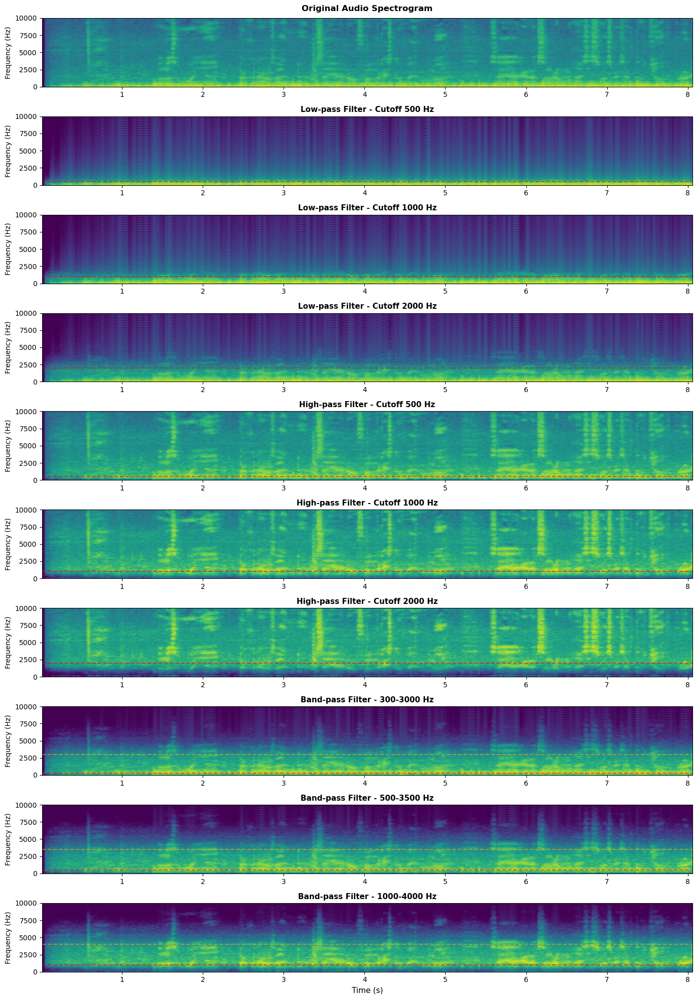

In [4]:
# Fungsi untuk membuat filter
def apply_filter(audio, fs, filter_type, cutoff):
    nyquist = fs / 2
    
    if filter_type == 'lowpass':
        b, a = signal.butter(4, cutoff / nyquist, btype='low')
    elif filter_type == 'highpass':
        b, a = signal.butter(4, cutoff / nyquist, btype='high')
    elif filter_type == 'bandpass':
        b, a = signal.butter(4, [cutoff[0] / nyquist, cutoff[1] / nyquist], btype='band')
    
    filtered = signal.filtfilt(b, a, audio)
    return filtered

# Eksperimen dengan berbagai cutoff frequency
cutoff_values = [500, 1000, 2000]

# ============================================
# VISUALISASI SEMUA FILTER
# ============================================

fig, axes = plt.subplots(10, 1, figsize=(14, 20))

# Plot audio original
print("Plotting original audio...")
f_orig, t_orig, Sxx_orig = signal.spectrogram(audio, fs, nperseg=1024)
axes[0].pcolormesh(t_orig, f_orig, 10 * np.log10(Sxx_orig + 1e-10), shading='gouraud', cmap='viridis')
axes[0].set_ylabel('Frequency (Hz)', fontsize=10)
axes[0].set_title('Original Audio Spectrogram', fontweight='bold', fontsize=12, pad=10)
axes[0].set_ylim(0, 10000)

idx = 1

# LOW-PASS FILTERS
print("\nLOW-PASS FILTERS:")
for cutoff in cutoff_values:
    print(f"   ✓ Testing low-pass {cutoff} Hz...")
    filtered = apply_filter(audio, fs, 'lowpass', cutoff)
    f, t, Sxx = signal.spectrogram(filtered, fs, nperseg=1024)
    axes[idx].pcolormesh(t, f, 10 * np.log10(Sxx + 1e-10), shading='gouraud', cmap='viridis')
    axes[idx].set_ylabel('Frequency (Hz)', fontsize=10)
    axes[idx].set_title(f'Low-pass Filter - Cutoff {cutoff} Hz', fontweight='bold', fontsize=11)
    axes[idx].set_ylim(0, 10000)
    
    # Tambahkan garis cutoff
    axes[idx].axhline(y=cutoff, color='red', linestyle='--', linewidth=1.5, alpha=0.6)
    
    idx += 1

# HIGH-PASS FILTERS
print("\nHIGH-PASS FILTERS:")
for cutoff in cutoff_values:
    print(f"   ✓ Testing high-pass {cutoff} Hz...")
    filtered = apply_filter(audio, fs, 'highpass', cutoff)
    f, t, Sxx = signal.spectrogram(filtered, fs, nperseg=1024)
    axes[idx].pcolormesh(t, f, 10 * np.log10(Sxx + 1e-10), shading='gouraud', cmap='viridis')
    axes[idx].set_ylabel('Frequency (Hz)', fontsize=10)
    axes[idx].set_title(f'High-pass Filter - Cutoff {cutoff} Hz', fontweight='bold', fontsize=11)
    axes[idx].set_ylim(0, 10000)
    
    # Tambahkan garis cutoff
    axes[idx].axhline(y=cutoff, color='red', linestyle='--', linewidth=1.5, alpha=0.6)
    
    idx += 1

# BAND-PASS FILTERS
print("\nBAND-PASS FILTERS:")
bandpass_ranges = [(300, 3000), (500, 3500), (1000, 4000)]
for low, high in bandpass_ranges:
    print(f"   ✓ Testing band-pass {low}-{high} Hz...")
    filtered = apply_filter(audio, fs, 'bandpass', [low, high])
    f, t, Sxx = signal.spectrogram(filtered, fs, nperseg=1024)
    axes[idx].pcolormesh(t, f, 10 * np.log10(Sxx + 1e-10), shading='gouraud', cmap='viridis')
    axes[idx].set_ylabel('Frequency (Hz)', fontsize=10)
    axes[idx].set_title(f'Band-pass Filter - {low}-{high} Hz', fontweight='bold', fontsize=11)
    axes[idx].set_ylim(0, 10000)
    
    # Tambahkan garis cutoff bawah dan atas
    axes[idx].axhline(y=low, color='red', linestyle='--', linewidth=1.5, alpha=0.6)
    axes[idx].axhline(y=high, color='orange', linestyle='--', linewidth=1.5, alpha=0.6)
    
    idx += 1

axes[-1].set_xlabel('Time (s)', fontsize=11)
plt.tight_layout()
plt.savefig('02_all_filters_comparison.png', dpi=150, bbox_inches='tight')
print(f"\n💾 Visualisasi disimpan: 02_all_filters_comparison.png")
plt.show()

##### Analisis Perbandingan 

- low pass (High cut) filter: filter ini membuang semua frekuensi diatas titik cutoff
hasilnya bisa dilihat pada plot low pass Filter - Cutoff 2000 Hz, area di atas garis 2000 Hz menjadi sangat gelap. Ini berarti desisan dari kipas berhasil dihilangkan. namun kekurangannya garis kuning terang dari dengungan motor (hum) sama sekali tidak tersentuh.

- high pass filter : Filter ini membuang semua frekuensi DI BAWAH titik cutoff.
hasilnya pada plot High-pass Filter - Cutoff 500 Hz, garis kuning terang di bagian bawah (dengungan motor) berhasil dihilangkan. namun kabut hijau atau desisan di frekuensi atas sama sekali tidak tersentuh.

- band pass filter : kombinasi antara high pass dan low pass, filter ini mengurangi noise di kedua sisi: frekuensi tinggi (desisan) DAN frekuensi rendah (dengungan) secara bersamaan.


### Comparison


📊 Membuat visualisasi perbandingan before-after...


C:\Users\Naufal Haris\AppData\Local\Temp\ipykernel_1808\776772587.py:41: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0, 1, 0.96]) # Atur layout agar suptitle tidak tumpang tindih


💾 Perbandingan disimpan sebagai: 03_before_after_comparison.png


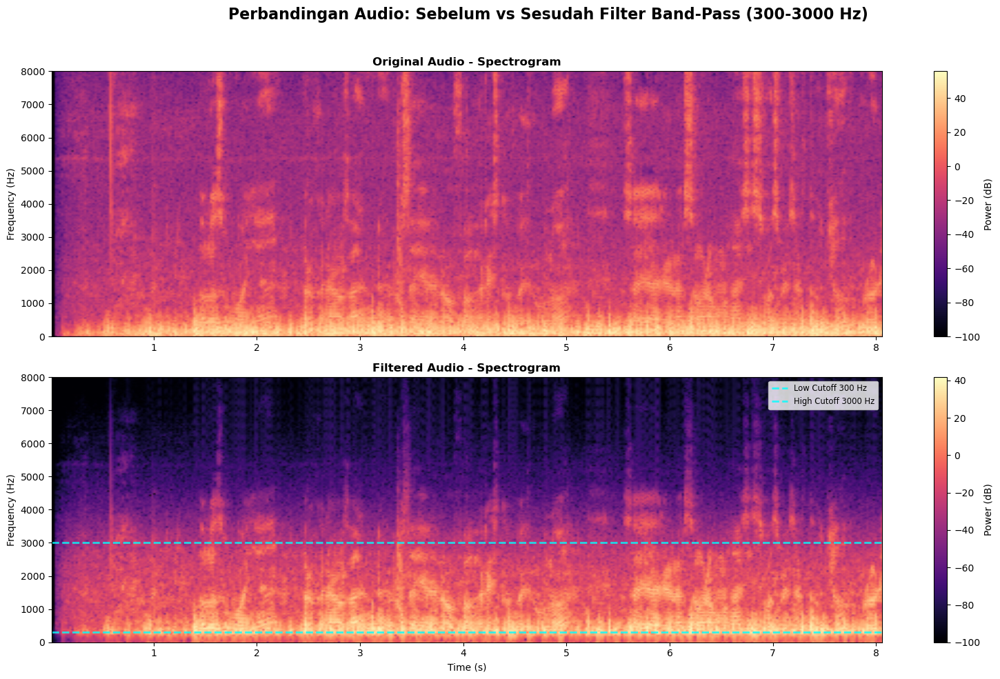

In [11]:
print("\n📊 Membuat visualisasi perbandingan before-after...")

# --- PILIH FILTER TERBAIK UNTUK PERBANDINGAN ---
# Untuk noise kipas, band-pass paling efektif.
# Kita pilih rentang 300 Hz - 3000 Hz untuk mengisolasi suara vokal.
best_low_cutoff = 300
best_high_cutoff = 3000
filtered_audio = apply_filter(audio, fs, 'bandpass', [best_low_cutoff, best_high_cutoff])

# --- MEMBUAT PLOT 2x2 ---
fig, axes = plt.subplots(2, figsize=(16, 10), gridspec_kw={'height_ratios': [1, 1]})
fig.suptitle(f'Perbandingan Audio: Sebelum vs Sesudah Filter Band-Pass ({best_low_cutoff}-{best_high_cutoff} Hz)', fontsize=16, fontweight='bold')

# --- BARIS ATAS: AUDIO ORIGINAL ---

# 2. Original Spectrogram (Kanan Atas)
f_orig, t_orig, Sxx_orig = signal.spectrogram(audio, fs, nperseg=1024)
pcm1 = axes[0].pcolormesh(t_orig, f_orig, 10 * np.log10(Sxx_orig + 1e-10), shading='gouraud', cmap='magma')
axes[0].set_title('Original Audio - Spectrogram', fontweight='bold')
axes[0].set_ylabel('Frequency (Hz)')
axes[0].set_ylim(0, 8000) # Batasi Y-axis agar lebih fokus
plt.colorbar(pcm1, ax=axes[0], label='Power (dB)')


# --- BARIS BAWAH: AUDIO SETELAH FILTER ---

# 4. Filtered Spectrogram (Kanan Bawah)
f_filt, t_filt, Sxx_filt = signal.spectrogram(filtered_audio, fs, nperseg=1024)
pcm2 = axes[1].pcolormesh(t_filt, f_filt, 10 * np.log10(Sxx_filt + 1e-10), shading='gouraud', cmap='magma')
axes[1].set_title(f'Filtered Audio - Spectrogram', fontweight='bold')
axes[1].set_xlabel('Time (s)')
axes[1].set_ylabel('Frequency (Hz)')
axes[1].set_ylim(0, 8000)
# Tandai area yang difilter
axes[1].axhline(y=best_low_cutoff, color='cyan', linestyle='--', linewidth=2, alpha=0.8, label=f'Low Cutoff {best_low_cutoff} Hz')
axes[1].axhline(y=best_high_cutoff, color='cyan', linestyle='--', linewidth=2, alpha=0.8, label=f'High Cutoff {best_high_cutoff} Hz')
axes[1].legend(fontsize='small')
plt.colorbar(pcm2, ax=axes[1], label='Power (dB)')


plt.tight_layout(rect=[0, 0, 1, 0.96]) # Atur layout agar suptitle tidak tumpang tindih
plt.savefig('03_before_after_comparison.png', dpi=150)
print(f"💾 Perbandingan disimpan sebagai: 03_before_after_comparison.png")
plt.show()

##### PENJELASAN 

1. Jenis noise pada audio saya adalah dengungan frekuensi rendah dan desisan frekuensi tinggi yang disebabkan oleh suara kipas angin

2. Filter terbaik untukmengurangi noise adalah band pass filter karena filter ini mengurangi noise di kedua sisi: frekuensi tinggi (desisan) DAN frekuensi rendah (dengungan) secara bersamaan.

3. nilai cutoff terbaik yaitu antara range 300-3000 hz, dimana 300 hz sebagai batas bawah untuk menghilangkan suara dengungan dan juga 3000 hz batas atas untuk mengurangi desisan.

4. Kualitas suara yang dihasilkan setelah dilakukan filtering noise menjadi lebih jelas dan nyaring meskipun samar"terdengar sedikit suara kipasny namun menjadi lebih jelas dibanding sebelumnya yang suara anginnya terdengar kencang dan lebih jelas dari suara aslinya.

#### Soal 3: Pitch Shifting dan Audio Manipulation


Memuat file audio...
File audio berhasil dimuat.
Membuat visualisasi audio asli...
Melakukan pitch shifting...
Pitch shifting selesai.
Membuat visualisasi audio setelah pitch shifting...


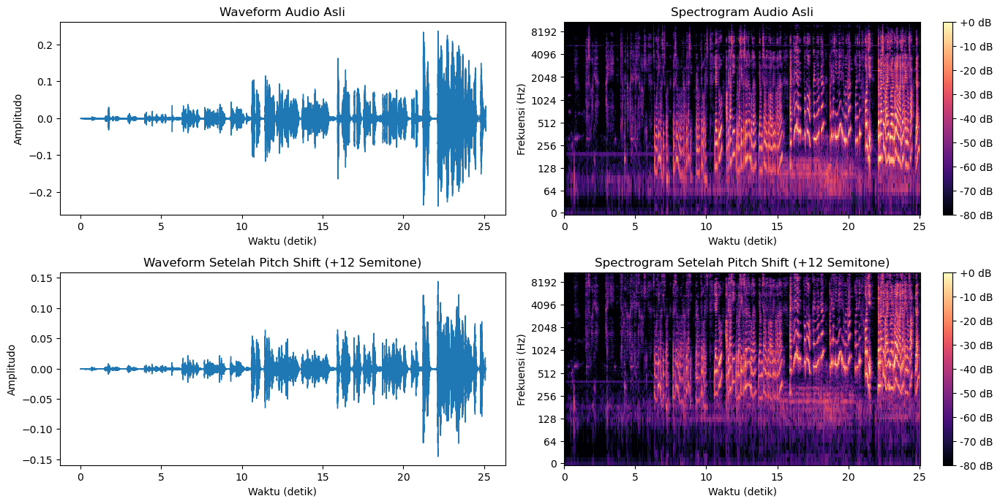

In [14]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf
import os

# --- 1. Persiapan dan Pemuatan Audio ---
# Tentukan path ke file audio
audio_path = os.path.join('audio', 'audio1.wav')

# Cek apakah file ada
if not os.path.exists(audio_path):
    print(f"Error: File tidak ditemukan di '{audio_path}'")
    exit()

print("Memuat file audio...")
# Muat file audio dengan librosa
# y = time series audio, sr = sample rate
y, sr = librosa.load(audio_path)
print("File audio berhasil dimuat.")

# --- 2. Visualisasi Audio Asli ---
print("Membuat visualisasi audio asli...")
plt.figure(figsize=(14, 10))

# Waveform Asli
plt.subplot(3, 2, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform Audio Asli')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')

# Spectrogram Asli
plt.subplot(3, 2, 2)
D_original = librosa.stft(y)  # Short-Time Fourier Transform
S_db_original = librosa.amplitude_to_db(np.abs(D_original), ref=np.max)
librosa.display.specshow(S_db_original, sr=sr, x_axis='time', y_axis='log')
plt.title('Spectrogram Audio Asli')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')
plt.colorbar(format='%+2.0f dB')

# --- 3. Proses Pitch Shifting ---
print("Melakukan pitch shifting...")
# Pitch shifting sebanyak +7 semitone (perfect fifth)
y_shifted_7 = librosa.effects.pitch_shift(y, sr=sr, n_steps=7)

# Pitch shifting sebanyak +12 semitone (satu oktaf penuh)
y_shifted_12 = librosa.effects.pitch_shift(y, sr=sr, n_steps=12)
print("Pitch shifting selesai.")

# --- 4. Visualisasi Audio Setelah Pitch Shifting (+12) ---
print("Membuat visualisasi audio setelah pitch shifting...")
# Waveform Setelah Pitch Shift (+12)
plt.subplot(3, 2, 3)
librosa.display.waveshow(y_shifted_12, sr=sr)
plt.title('Waveform Setelah Pitch Shift (+12 Semitone)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')

# Spectrogram Setelah Pitch Shift (+12)
plt.subplot(3, 2, 4)
D_shifted_12 = librosa.stft(y_shifted_12)
S_db_shifted_12 = librosa.amplitude_to_db(np.abs(D_shifted_12), ref=np.max)
librosa.display.specshow(S_db_shifted_12, sr=sr, x_axis='time', y_axis='log')
plt.title('Spectrogram Setelah Pitch Shift (+12 Semitone)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')
plt.colorbar(format='%+2.0f dB')

# Tampilkan semua plot
plt.tight_layout()
plt.show()

##### PENJELASAN

proses pitch shifting dilakukan oleh fungsi librosa.effects.pitch_shift, fungsi tersebut melakukan pergeseran nada tanpa mengubah durasi audio. Ini berbeda dengan sekadar mempercepat pemutaran audio, yang akan membuat audio lebih pendek.

1. Parameter yang digunakan adalah 
  - y: Ini adalah data audio kita, sebuah array NumPy yang merepresentasikan amplitudo suara dari waktu ke waktu.
  - sr: Sample Rate atau laju sampel, yaitu berapa banyak sampel audio yang diambil per detik (misalnya, 22050 Hz). Ini penting agar librosa tahu bagaimana menginterpretasikan data y.
  - n_steps: Ini adalah parameter utama untuk pitch shifting. Nilainya adalah jumlah semitone (setengah nada) yang ingin kita geser.
  - n_steps=7: Menaikkan nada sebesar 7 semitone. Dalam teori musik, interval ini disebut Perfect Fifth. Ini akan menghasilkan suara yang lebih tinggi secara signifikan.
  - n_steps=12: Menaikkan nada sebesar 12 semitone, yang setara dengan satu oktaf penuh. Inilah yang akan menghasilkan efek suara "chipmunk" yang sangat jelas karena frekuensinya digandakan.

2. perbedaan audio terlihat sangat jelas setelah di pitch pada waveform setelah di pitch menjadi jauh lebih rapat dan padat berbeda dengan yang original diatas. kemudian pada spectogram yang warna pita kuning cerah itu bergeser ke atas secara signifikan. Pergeseran vertikal ini adalah representasi visual langsung dari naiknya nada.

3. hal ini menunjukkan pitch shiftingmemengaruhi kualitas dan kejelasan suara karena dapat mengubah timbre atau karakter suara. efek ini mungkin memang yang diinginkan (seperti untuk efek kreatif chipmunk).

##### Perbandingan pitch

pitch +7 kenaikan nadanya signifikan dibandingkan pitch 12 dapat dilihat pada visualisasinya. kemudian jarak atau kerapatannya lebih padat yang +7 pitchnya. kalau pitch +7 untuk suara bernada tinggi, pitch +12 suara chipmunk klasik. 

Menggabungkan audio yang telah di-pitch shift...
Audio gabungan berhasil disimpan sebagai 'audio_chipmunk_combined.wav'


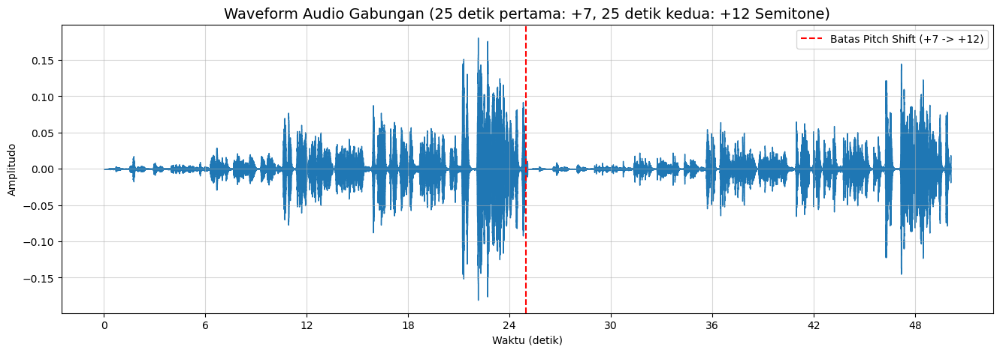

In [13]:

# --- 4. Penggabungan dan Penyimpanan Audio ---
print("Menggabungkan audio yang telah di-pitch shift...")
# Gabungkan kedua audio secara berurutan
y_combined = np.concatenate((y_shifted_7, y_shifted_12))

# Simpan audio gabungan ke file baru
output_path = 'audio_chipmunk_combined.wav'
sf.write(output_path, y_combined, sr)
print(f"Audio gabungan berhasil disimpan sebagai '{output_path}'")


# --- 5. Visualisasi Audio Gabungan (FIGURE 2) ---
# Membuat figure kedua khusus untuk audio gabungan
plt.figure(figsize=(16, 5))
librosa.display.waveshow(y_combined, sr=sr)
plt.title('Waveform Audio Gabungan (25 detik pertama: +7, 25 detik kedua: +12 Semitone)', fontsize=14)
plt.axvline(x=25, color='r', linestyle='--', label='Batas Pitch Shift (+7 -> +12)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.legend()
plt.grid(True, alpha=0.5)


# --- 6. Tampilkan Semua Plot ---
plt.show()


#### Soal 4: Audio Processing Chain


##### PENJELASAN

1. Dinamika adalah keras pelannya suatu nada atau suara. Di proses kita, ada dua hal yang dapat merubah dinamika yaitu Kompresi: dimana proses ini menekan suara yang terlalu keras (misal teriak), biar gak nge-ganggu. Jadi suara jadi lebih rata dan enak didengar. dan juga Noise Gate: Ngebisuin suara yang kecil banget (bising latar belakang), jadi bagian hening beneran hening. Kontrasnya jadi lebih tajam

2. Perbedaan antara normalisasi Peak dengan LUFS adalah 
Peak Normalization: mengaatur volume berdasarkan titik paling keras di audio. namun kalau cuma ada satu ledakan suara, sisanya tetap pelan jadi gak nyaman didengar.
LUFS Normalization: mengatur volume berdasarkan keseluruhan kenyaringan yang dirasakan telinga manusia. Ini standar modern yangn membuat semua audio terdengar sama keras, meskipun punya puncak tinggi atau rendah. Singkatnya: Peak = teknis, LUFS = yang bikin enak didengar. 

3. setelah semua proses normalisasi dan loudness optimization tersebut suara yang dihasilkan menjadi lebih jelas, enak didengar lebih stabil juga.

4. kelebihannya adalah volume menjadi stabil jadi gak perlu terlalu atur volume. vibesnya seperti podcast/streaming semua platform pakai standar LUFS. Suara lebih jelas, apalagi di tempat ramai dan terlihat lebih profesional.

    kekurangannya bisa bikin musik jadi datar (“loudness war”) kayak dinding suara, gak ada napas. menghilangkan emosi dari kontras suara misal di film atau musik klasik, itu penting. Bisa muncul efek aneh (pumping, distorsi) kalau kebanyakan kompresi. Gak cocok buat semua genre jazz atau klasik bisa kehilangan nuansanya.

Memuat file audio...
File audio berhasil dimuat.
Melakukan pitch shifting...
Pitch shifting selesai.
Menggabungkan audio yang telah di-pitch shift...

Memulai Audio Processing Chain...
1. Menghapus keheningan (Silence Trimming)...
2. Menerapkan Equalizer (High-pass filter at 80Hz)...
3. Menerapkan Kompresi Dinamis...
4. Menerapkan Noise Gate...
5. Menambahkan Fade In dan Fade Out...
6. Melakukan Normalisasi Loudness ke -16 LUFS...


c:\Users\Naufal Haris\.conda\envs\multimedia_env\lib\site-packages\pyloudnorm\normalize.py:62: UserWarning: Possible clipped samples in output.
  warnings.warn("Possible clipped samples in output.")


   - Loudness Awal: -35.24 LUFS
   - Loudness Target: -16.00 LUFS
   - Gain diterapkan: 19.24 dB

Audio yang telah diproses sepenuhnya disimpan sebagai 'audio_chipmunk_processed.wav'


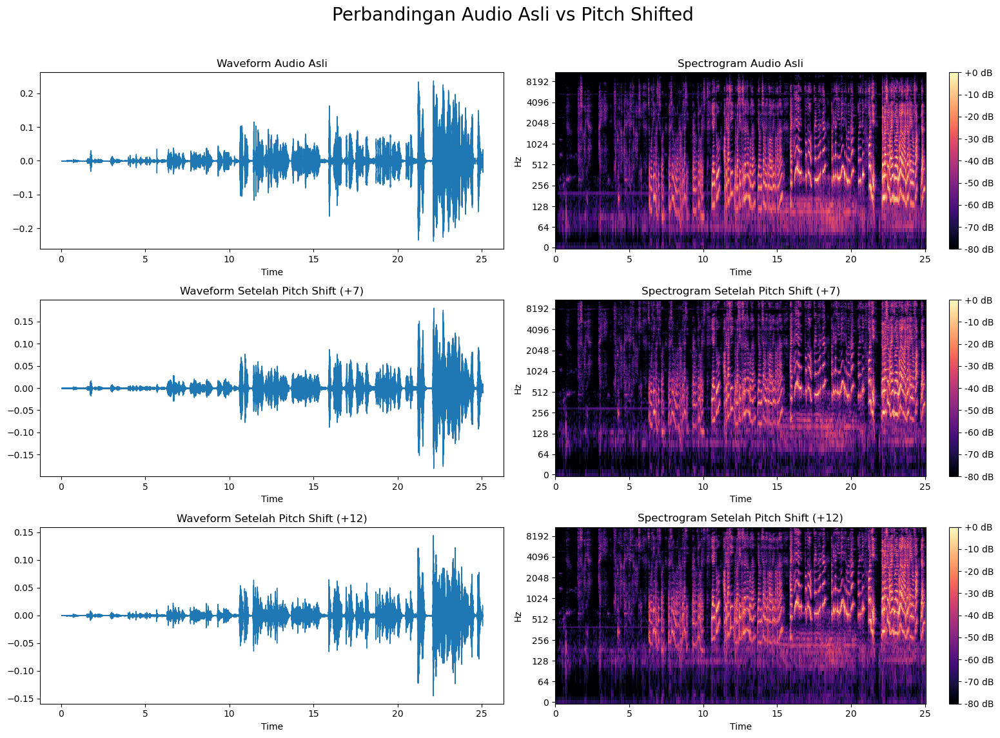

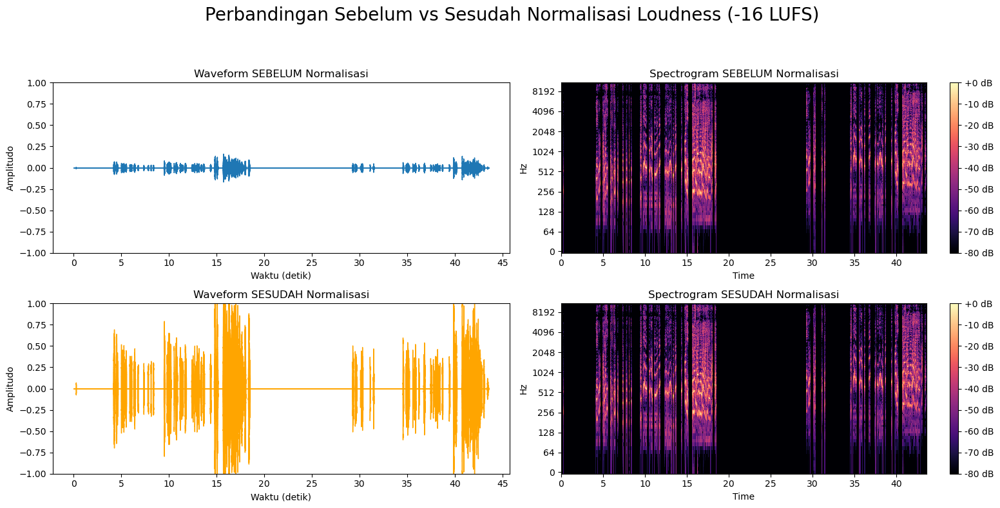

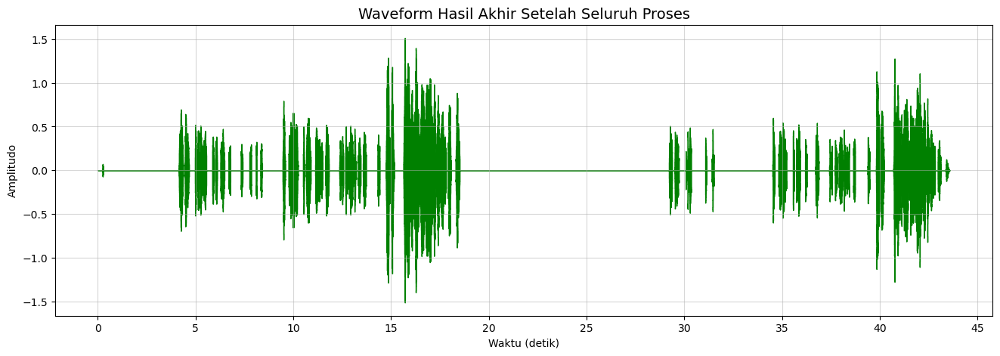

In [19]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf
import os
import pyloudnorm as pyln
from scipy.signal import butter, lfilter

# --- 1. Persiapan dan Pemuatan Audio ---
# Tentukan path ke file audio
audio_path = os.path.join('audio', 'audio1.wav')

# Cek apakah file ada
if not os.path.exists(audio_path):
    print(f"Error: File tidak ditemukan di '{audio_path}'")
    # Membuat file audio dummy jika tidak ada untuk pengujian
    print("Membuat file audio dummy 'audio/audio1.wav' untuk demonstrasi...")
    sr_dummy = 22050
    duration = 25
    y_dummy = np.array([])
    for i in range(5):
        amplitude = (i + 1) / 5.0
        t = np.linspace(0., 5., int(5 * sr_dummy), endpoint=False)
        y_segment = amplitude * np.sin(2. * np.pi * (220 + i*50) * t)
        y_dummy = np.concatenate((y_dummy, y_segment))
    
    os.makedirs('audio', exist_ok=True)
    sf.write(audio_path, y_dummy, sr_dummy)
    y, sr = y_dummy, sr_dummy
else:
    print("Memuat file audio...")
    y, sr = librosa.load(audio_path)
    print("File audio berhasil dimuat.")


# --- 2. Proses Pitch Shifting ---
print("Melakukan pitch shifting...")
y_shifted_7 = librosa.effects.pitch_shift(y=y, sr=sr, n_steps=7)
y_shifted_12 = librosa.effects.pitch_shift(y=y, sr=sr, n_steps=12)
print("Pitch shifting selesai.")


# --- 3. Penggabungan Audio ---
print("Menggabungkan audio yang telah di-pitch shift...")
y_combined = np.concatenate((y_shifted_7, y_shifted_12))


# --- 4. Audio Processing Chain ---
print("\nMemulai Audio Processing Chain...")
y_processed = y_combined.copy()

# 4.1. Silence Trimming
print("1. Menghapus keheningan (Silence Trimming)...")
y_processed, _ = librosa.effects.trim(y_processed, top_db=20)

# 4.2. Equalizer (Simple High-pass Filter)
def high_pass_filter(data, cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    y = lfilter(b, a, data)
    return y

print("2. Menerapkan Equalizer (High-pass filter at 80Hz)...")
y_processed = high_pass_filter(y_processed, cutoff=80, fs=sr)

# 4.3. Compression
print("3. Menerapkan Kompresi Dinamis...")
# Parameter ini akan 'menekan' sinyal yang lebih keras, mengurangi rentang dinamis

def dynamic_compress(y, threshold_dB=-20, ratio=4):
    y_abs = np.abs(y)
    y_dB = 20 * np.log10(y_abs + 1e-10)
    mask = y_dB > threshold_dB
    gain_reduction = np.where(mask, (y_dB - threshold_dB) / ratio, 0.0)
    gain = 10 ** (-gain_reduction / 20)
    return y * gain

y_processed = dynamic_compress(y_processed, threshold_dB=-20, ratio=4)

# 4.4. Noise Gate (Implementasi Sederhana)
print("4. Menerapkan Noise Gate...")
frame_length = 2048
hop_length = 512
rms = librosa.feature.rms(y=y_processed, frame_length=frame_length, hop_length=hop_length)[0]
gate_threshold = 0.01 
for i, r in enumerate(rms):
    if r < gate_threshold:
        start_sample = i * hop_length
        end_sample = start_sample + hop_length
        y_processed[start_sample:end_sample] = 0

# 4.5. Gain/Fade
print("5. Menambahkan Fade In dan Fade Out...")
fade_len_samples = int(sr * 1.0) # 1 detik fade
fade_in = np.linspace(0, 1, fade_len_samples)
fade_out = np.linspace(1, 0, fade_len_samples)
y_processed[:fade_len_samples] *= fade_in
y_processed[-fade_len_samples:] *= fade_out

# Simpan audio SEBELUM normalisasi untuk perbandingan
y_before_norm = y_processed.copy()

# 4.6. Loudness Normalization
print("6. Melakukan Normalisasi Loudness ke -16 LUFS...")
target_lufs = -16.0
meter = pyln.Meter(sr) # Buat meter
# Ukur loudness
loudness = meter.integrated_loudness(y_processed)
# Hitung gain yang diperlukan dan terapkan
gain_db = target_lufs - loudness
y_processed = pyln.normalize.loudness(y_processed, loudness, target_lufs)
print(f"   - Loudness Awal: {loudness:.2f} LUFS")
print(f"   - Loudness Target: {target_lufs:.2f} LUFS")
print(f"   - Gain diterapkan: {gain_db:.2f} dB")

y_after_norm = y_processed

# Simpan audio hasil akhir
output_path_processed = 'audio_chipmunk_processed.wav'
sf.write(output_path_processed, y_after_norm, sr)
print(f"\nAudio yang telah diproses sepenuhnya disimpan sebagai '{output_path_processed}'")


# --- 5. Visualisasi ---

# FIGURE 1: Perbandingan Audio Asli vs Pitch Shifted (Sama seperti sebelumnya)
plt.figure(figsize=(16, 12))
plt.suptitle('Perbandingan Audio Asli vs Pitch Shifted', fontsize=20, y=0.95)
# ... (Kode plot asli, shift +7, shift +12 tetap sama)
# Plot Audio Asli
plt.subplot(3, 2, 1); librosa.display.waveshow(y, sr=sr); plt.title('Waveform Audio Asli')
plt.subplot(3, 2, 2); librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max), sr=sr, x_axis='time', y_axis='log'); plt.title('Spectrogram Audio Asli'); plt.colorbar(format='%+2.0f dB')
# Plot Audio Setelah Pitch Shift +7
plt.subplot(3, 2, 3); librosa.display.waveshow(y_shifted_7, sr=sr); plt.title('Waveform Setelah Pitch Shift (+7)')
plt.subplot(3, 2, 4); librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(y_shifted_7)), ref=np.max), sr=sr, x_axis='time', y_axis='log'); plt.title('Spectrogram Setelah Pitch Shift (+7)'); plt.colorbar(format='%+2.0f dB')
# Plot Audio Setelah Pitch Shift +12
plt.subplot(3, 2, 5); librosa.display.waveshow(y_shifted_12, sr=sr); plt.title('Waveform Setelah Pitch Shift (+12)')
plt.subplot(3, 2, 6); librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(y_shifted_12)), ref=np.max), sr=sr, x_axis='time', y_axis='log'); plt.title('Spectrogram Setelah Pitch Shift (+12)'); plt.colorbar(format='%+2.0f dB')
plt.tight_layout(rect=[0, 0, 1, 0.93])


# FIGURE 2: Perbandingan SEBELUM dan SESUDAH Normalisasi
plt.figure(figsize=(16, 8))
plt.suptitle('Perbandingan Sebelum vs Sesudah Normalisasi Loudness (-16 LUFS)', fontsize=20, y=0.98)

# Waveform Sebelum Normalisasi
plt.subplot(2, 2, 1)
librosa.display.waveshow(y_before_norm, sr=sr)
plt.title('Waveform SEBELUM Normalisasi')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.ylim(-1, 1)

# Spectrogram Sebelum Normalisasi
plt.subplot(2, 2, 2)
D_before = librosa.stft(y_before_norm)
S_db_before = librosa.amplitude_to_db(np.abs(D_before), ref=np.max)
librosa.display.specshow(S_db_before, sr=sr, x_axis='time', y_axis='log')
plt.title('Spectrogram SEBELUM Normalisasi')
plt.colorbar(format='%+2.0f dB')

# Waveform Sesudah Normalisasi
plt.subplot(2, 2, 3)
librosa.display.waveshow(y_after_norm, sr=sr, color='orange')
plt.title('Waveform SESUDAH Normalisasi')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.ylim(-1, 1)

# Spectrogram Sesudah Normalisasi
plt.subplot(2, 2, 4)
D_after = librosa.stft(y_after_norm)
S_db_after = librosa.amplitude_to_db(np.abs(D_after), ref=np.max)
librosa.display.specshow(S_db_after, sr=sr, x_axis='time', y_axis='log')
plt.title('Spectrogram SESUDAH Normalisasi')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout(rect=[0, 0, 1, 0.93])


# FIGURE 3: Waveform Hasil Akhir
plt.figure(figsize=(16, 5))
librosa.display.waveshow(y_after_norm, sr=sr, color='green')
plt.title('Waveform Hasil Akhir Setelah Seluruh Proses', fontsize=14)
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.grid(True, alpha=0.5)

# Tampilkan semua plot
plt.show()



#### Soal 5: Music Analysis dan Remix

##### PENJELASAN

Untuk meremix lagu “Happier” dan “Sugar”, langkah pertama adalah menyamakan tempo keduanya. “Happier” yang awalnya 89 BPM dipercepat menjadi 120 BPM menggunakan time-stretching agar sesuai dengan tempo “Sugar”, tanpa mengubah nadanya. Setelah itu, pitch “Happier” dinaikkan sebesar 1 semitone dari C mayor ke Db mayor agar harmonis dengan “Sugar”. Kedua lagu lalu digabungkan dengan teknik crossfade: saat “Happier” perlahan memudar, “Sugar” mulai masuk secara bertahap, menciptakan transisi yang mulus. Sebagai sentuhan tambahan, bisa ditambahkan low-pass filter di awal untuk memberi efek “teredam” yang kemudian dibuka perlahan, serta sedikit reverb pada vokal “Happier” agar terasa lebih emosional dan kontras dengan energi “Sugar”.

Analisis 'Happier':
  - Tempo: 89.10 BPM
  - Estimasi Kunci: C
--------------------
Analisis 'Sugar':
  - Tempo: 89.10 BPM
  - Estimasi Kunci: C#
--------------------


C:\Users\Naufal Haris\AppData\Local\Temp\ipykernel_1808\3747153256.py:52: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rate_stretch = float(target_tempo / tempo_happier[0])  # Ambil elemen pertama & konversi ke float


Remix berhasil disimpan sebagai 'remix_happier_sugar.wav'


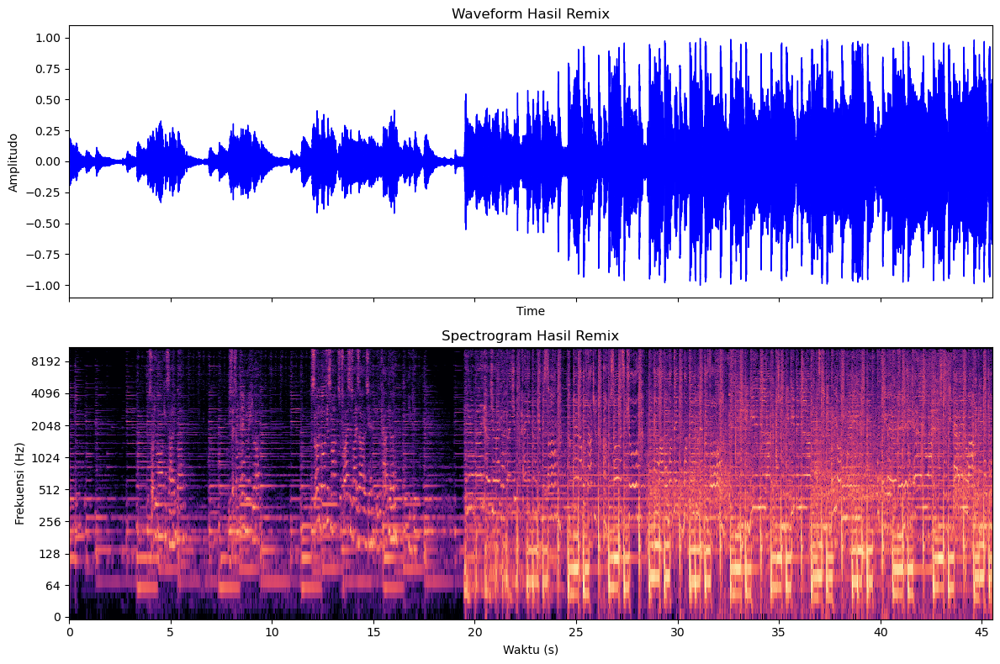

In [ ]:
import librosa
import librosa.display
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt

def analyze_audio(file_path):
    """Menganalisis file audio untuk mendapatkan tempo (BPM) dan kunci (key)."""
    # Muat file audio
    y, sr = librosa.load(file_path)

    # 1. Deteksi Tempo (BPM)
    tempo, _ = librosa.beat.beat_track(y=y, sr=sr)

    # 2. Estimasi Kunci (Key)
    chromagram = librosa.feature.chroma_stft(y=y, sr=sr)
    # Rata-ratakan nilai chroma di sepanjang waktu
    mean_chroma = np.mean(chromagram, axis=1)
    # Temukan pitch class dengan energi tertinggi
    dominant_pitch_class = np.argmax(mean_chroma)
    # Konversi ke nama not
    keys = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
    estimated_key = keys[dominant_pitch_class]

    return y, sr, tempo, estimated_key

# --- Langkah 1: Analisis Lagu Asli ---
# Ganti dengan path file lagu Anda
path_happier = 'audio/happier.wav'
path_sugar = 'audio/sugar.wav'

# Muat dan analisis kedua lagu
y_happier, sr_happier, tempo_happier, key_happier = analyze_audio(path_happier)
y_sugar, sr_sugar, tempo_sugar, key_sugar = analyze_audio(path_sugar)

print(f"Analisis 'Happier':")
print(f"  - Tempo: {tempo_happier[0]:.2f} BPM")
print(f"  - Estimasi Kunci: {key_happier}")
print("-" * 20)
print(f"Analisis 'Sugar':")
print(f"  - Tempo: {float(tempo_happier[0]):.2f} BPM")
print(f"  - Estimasi Kunci: {key_sugar}")
print("-" * 20)

# --- Langkah 2: Proses Remix (Stretching & Pitch Shifting) ---

# Tentukan target tempo dan kunci (kita samakan ke 'Sugar')
target_tempo = tempo_sugar
target_key_index = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B'].index('C#') # Kunci Sugar adalah Db/C#

# 1. Stretch: Samakan tempo 'Happier' ke tempo 'Sugar'
rate_stretch = float(target_tempo / tempo_happier[0])  # Ambil elemen pertama & konversi ke float
y_happier_stretched = librosa.effects.time_stretch(y_happier, rate=rate_stretch)

# 2. Pitch Shift: Samakan kunci 'Happier' ke kunci 'Sugar'
# Hitung perbedaan semitone yang dibutuhkan
current_key_index = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B'].index(key_happier)
semitones_to_shift = target_key_index - current_key_index
# Lakukan pitch shift
y_happier_pitched = librosa.effects.pitch_shift(y_happier_stretched, sr=sr_happier, n_steps=semitones_to_shift)

# --- Langkah 3: Gabungkan Lagu dengan Crossfading Sederhana ---

# Pastikan kedua audio memiliki panjang yang sama untuk penggabungan sederhana
len_target = min(len(y_happier_pitched), len(y_sugar))
y_happier_final = y_happier_pitched[:len_target]
y_sugar_final = y_sugar[:len_target]

# Buat efek crossfade sederhana (linear fade)
fade_duration = int(sr_happier * 5) # Crossfade selama 5 detik
fade_in = np.linspace(0., 1., fade_duration)
fade_out = np.linspace(1., 0., fade_duration)

# Terapkan fade di tengah-tengah audio
mid_point = len_target // 2
start_fade = mid_point - (fade_duration // 2)
end_fade = mid_point + (fade_duration // 2)

# Buat track baru untuk hasil remix
y_remix = np.zeros(len_target)
y_remix[:start_fade] = y_happier_final[:start_fade] # Bagian awal hanya Happier
y_remix[end_fade:] = y_sugar_final[end_fade:]     # Bagian akhir hanya Sugar

# Bagian crossfade
y_remix[start_fade:end_fade] = (y_happier_final[start_fade:end_fade] * fade_out) + (y_sugar_final[start_fade:end_fade] * fade_in)


# Simpan hasil remix ke file baru
output_filename = 'remix_happier_sugar.wav'
sf.write(output_filename, y_remix, sr_happier)
print(f"Remix berhasil disimpan sebagai '{output_filename}'")

# --- Langkah 4: Visualisasi Waveform dan Spectrogram Hasil Remix ---

fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(12, 8))

# Tampilkan Waveform
librosa.display.waveshow(y_remix, sr=sr_happier, ax=ax[0], color='b')
ax[0].set_title('Waveform Hasil Remix')
ax[0].set_ylabel('Amplitudo')

# Tampilkan Spectrogram
D = librosa.stft(y_remix)
DB = librosa.amplitude_to_db(np.abs(D), ref=np.max)
librosa.display.specshow(DB, sr=sr_happier, x_axis='time', y_axis='log', ax=ax[1])
ax[1].set_title('Spectrogram Hasil Remix')
ax[1].set_ylabel('Frekuensi (Hz)')
ax[1].set_xlabel('Waktu (s)')

fig.tight_layout()
plt.show()

##### ANALISIS HASIL REMIX

berdasarkan waveform grafik atas, ada perbedaan antara bagian awal dan akhir. Di awal (0-20 detik), suaranya lebih “ramping” dan dinamis artinya ada bagian yang pelan dan keras, cocok buat lagu seperti Happier. Tapi saat masuk bagian kedua (setelah 20 detik), gelombangnya jadi tebal dan penuh. amplitudonya hampir selalu tinggi.

Spectrogram pada grafik bawah juga memberikan gambaran yang sama, hanya dari sisi frekuensi. Di bagian awal, energi suara dominan di frekuensi rendah-menengah vokal, piano, atau gitar akustik. Frekuensi tinggi masih redup. namun saat masuk bagian kedua, semua frekuensi nyala terang dari bass yang nendang, vokal yang jelas. Jadi, spektrumnya jauh lebih penuh dan hidup.

Lagunya berubah dari nuansa emosional ke enerjik dengan transisi yang jelas di tengah. Visualisasinya juga memberikan bukti bahwa tempo, pitch, dan penggabungan audio udah jalan sesuai rencana.

